In [ ]:
from GroundingDINO.groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2
from matplotlib import pyplot as plt
import os
import shutil
import torch

# check if cuda is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
# load model
model = load_model("GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "GroundingDINO/weights/groundingdino_swint_ogc.pth")

# model to gpu
model.to(device)

IMAGE_PATH = "simple_images/safety glasses hardhat operators/safety glasses hardhat operators_19.jpg"
TEXT_PROMPT = "Hard hat"
BOX_TRESHOLD = 0.5
TEXT_TRESHOLD = 0.25

# load image
image_source, image = load_image(IMAGE_PATH)

# move image to gpu
image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

# show the image using opencv and matplotlib
plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
plt.show()


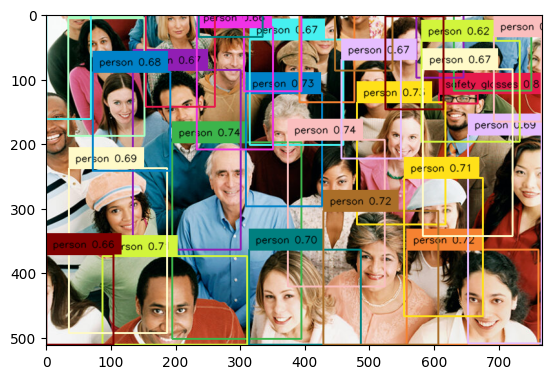

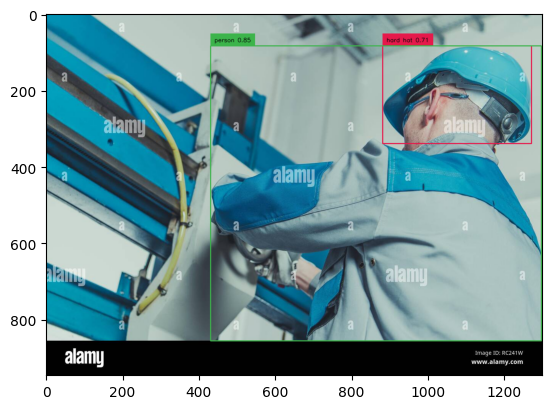

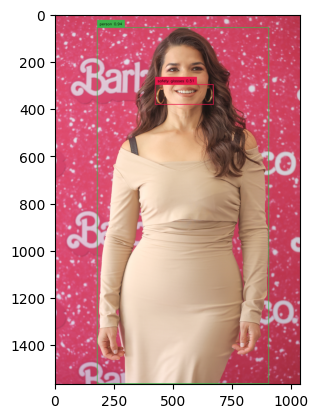

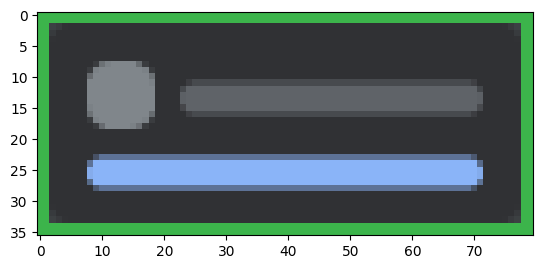

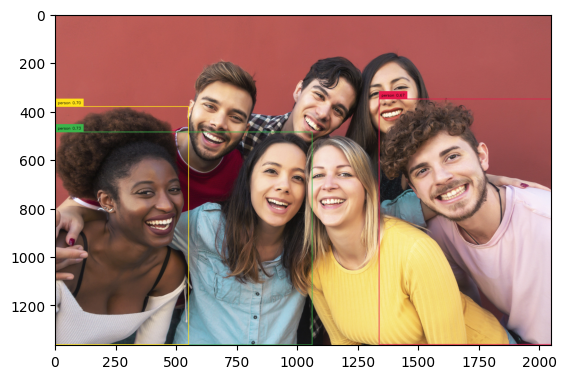

...

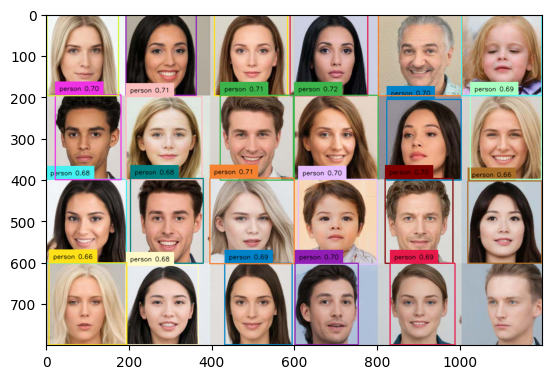

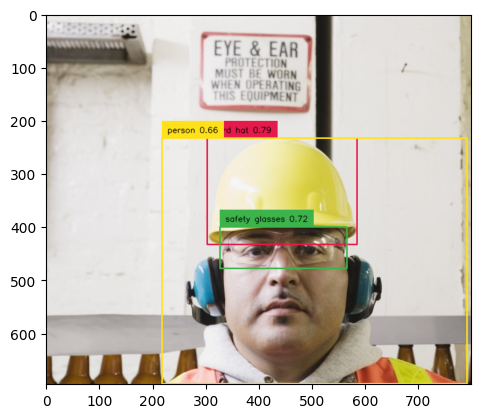

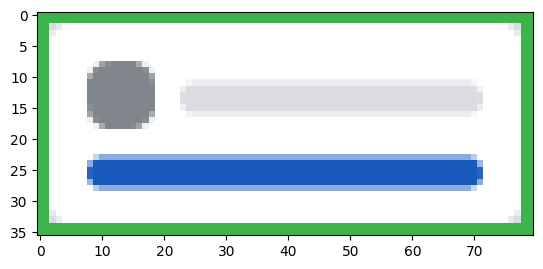

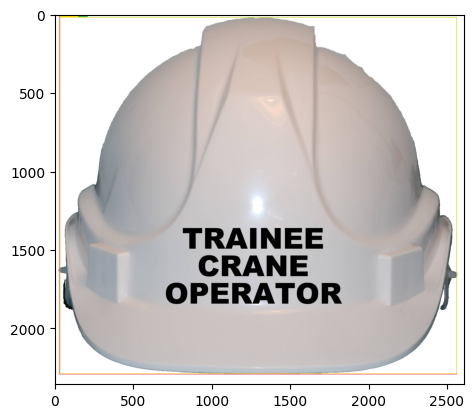

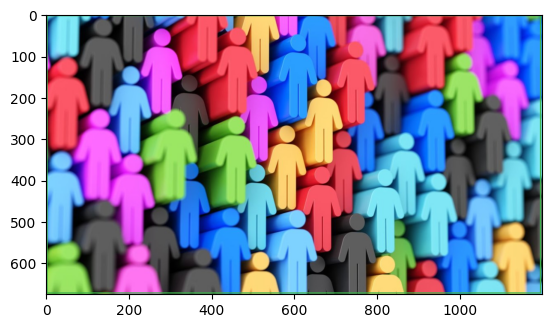

In [66]:
# parameters
CLEAN_FOLDER = True
PLOT_IMAGES = True
BREAK_AFTER = 0 # if > 0, break after this many images
BOX_TRESHOLD = 0.5
TEXT_TRESHOLD = 0.25


classes = ['hard hat', 'safety glasses', 'person']

input_folder = 'simple_images/test'
output_folder = 'output_folder'
image_folder = os.path.join(output_folder, 'images')
annotation_folder = os.path.join(output_folder, 'annotations')

# if clean folder is true, delete the output folder
if CLEAN_FOLDER:
    shutil.rmtree(output_folder)

# if output folder does not exist, create it
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    os.makedirs(image_folder)
    os.makedirs(annotation_folder)
  
# get all images in the input folder
images = os.listdir(input_folder)

# for each image in the input folder
for idx, file in enumerate(images):

    # create the full input path and read the file
    input_path = os.path.join(input_folder, file)
    image_source, image = load_image(input_path)

    # move image to gpu
    image.to(device)

    out_boxes = []
    out_logits = []
    out_phrases = []

    # for each class
    for class_name in classes:
        with torch.no_grad():
            
            TEXT_PROMPT = class_name
            # predict the bounding boxes, logits and phrases
            boxes, logits, phrases = predict(
                model=model,
                image=image,
                caption=TEXT_PROMPT,
                box_threshold=BOX_TRESHOLD,
                text_threshold=TEXT_TRESHOLD
            )

            # append the results to the output lists
            out_boxes.append(boxes)
            out_logits.append(logits)
            out_phrases.append([class_name for i in range(len(boxes))])
    
    # stack the output lists
    out_boxes = torch.cat(out_boxes, dim=0)
    out_logits = torch.cat(out_logits, dim=0)
    out_phrases = [phrase for sublist in out_phrases for phrase in sublist]
    
    # if the model finds any bounding boxes
    if len(out_boxes) > 0:
        
        if PLOT_IMAGES:
            # create annotations show the image using opencv and matplotlib
            annotated_frame = annotate(image_source=image_source, boxes=out_boxes, logits=out_logits, phrases=out_phrases)
            plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            plt.show()

        # write the image to the image folder
        image_path = os.path.join(image_folder, file)
        cv2.imwrite(image_path, image_source)

        # create the annotation file
        annotation_file = file.replace('.jpg', '.txt')
        annotation_path = os.path.join(annotation_folder, annotation_file)

        # open the annotation file
        with open(annotation_path, 'w') as f:
            
            # convert out phrases to indices
            out_phrases = [classes.index(s) for s in out_phrases]

            # for each bounding box
            for box, logits, phrase in zip(out_boxes, out_logits, out_phrases):
                # write the bounding box to the file
                f.write(f"{phrase} {box[0]} {box[1]} {box[2]} {box[3]}\n")

    if BREAK_AFTER > 0 and idx == BREAK_AFTER:
        break
    
    

    